# 2. Fully Convolutional Networks for Semantic Segmentation

In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torch.nn as nn
import torchvision.models as models
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T
from tqdm import tqdm
import wandb
import torchmetrics
from torchmetrics.segmentation import MeanIoU
from matplotlib.colors import ListedColormap
import random

/home2/kushang/miniconda3/envs/metal_chelate/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
!pip install torchmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 961.5/961.5 kB 25.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 65.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 36.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 53.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 9.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 80.7 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!unzip "seg_dataset_224.zip"

Archive:  seg_dataset_224.zip
   creating: dataset_224/test/
   creating: dataset_224/test/images/
  inflating: dataset_224/test/images/02_00_009.png  
  inflating: dataset_224/test/images/02_00_019.png  
  inflating: dataset_224/test/images/02_00_029.png  
  inflating: dataset_224/test/images/02_00_039.png  
  inflating: dataset_224/test/images/02_00_049.png  
  inflating: dataset_224/test/images/02_00_059.png  
  inflating: dataset_224/test/images/02_00_069.png  
  inflating: dataset_224/test/images/02_00_079.png  
  inflating: dataset_224/test/images/02_00_089.png  
  inflating: dataset_224/test/images/02_00_099.png  
  inflating: dataset_224/test/images/02_00_109.png  
  inflating: dataset_224/test/images/02_00_119.png  
  inflating: dataset_224/test/images/02_00_129.png  
  inflating: dataset_224/test/images/02_00_139.png  
  inflating: dataset_224/test/images/02_00_149.png  
  inflating: dataset_224/test/images/02_00_159.png  
  inflating: dataset_224/test/images/02_00_169.png  


## 2.1 Dataset Visualization

In [6]:
classes = {
    0: "Unlabeled",
    1: "Building",
    2: "Fence",
    3: "Other",
    4: "Pedestrian",
    5: "Pole",
    6: "Roadline",
    7: "Road",
    8: "Sidewalk",
    9: "Vegetation",
    10: "Car",
    11: "Wall",
    12: "Traffic sign"
}

In [7]:
# LLM - how to plot images using axes in matplotlib

def visualize_segmentation_classes(image_path, mask_path):

    image = Image.open(image_path).convert("RGB")
    image_np = np.array(image)
    mask = Image.open(mask_path)
    mask_np = np.array(mask)[:, :, 0]

    fig, axes = plt.subplots(2, 7, figsize=(18, 10))
    axes = axes.flatten()

    axes[0].imshow(image_np)
    axes[0].set_title("Original Image")
    axes[0].axis('off')


    for class_id in range(13):
        binary_mask = (mask_np == class_id).astype(np.uint8)
        ax = axes[class_id+1]
        ax.imshow(binary_mask, cmap='gray')
        ax.set_title(f"{class_id}: {classes[class_id]}")
        ax.axis('off')

    plt.tight_layout()
    plt.show()

In [5]:
train_image_folder = "dataset_224/train/images"

for i, file_name in enumerate(os.listdir(train_image_folder)):
    img_path = os.path.join(train_image_folder, file_name)
    image=Image.open(img_path).convert("RGB")
    print(f"Image {i}: {image.size}")
    break

Image 0: (224, 224)


dataset_224/train/images/F67-62.png
dataset_224/train/labels/F67-62.png


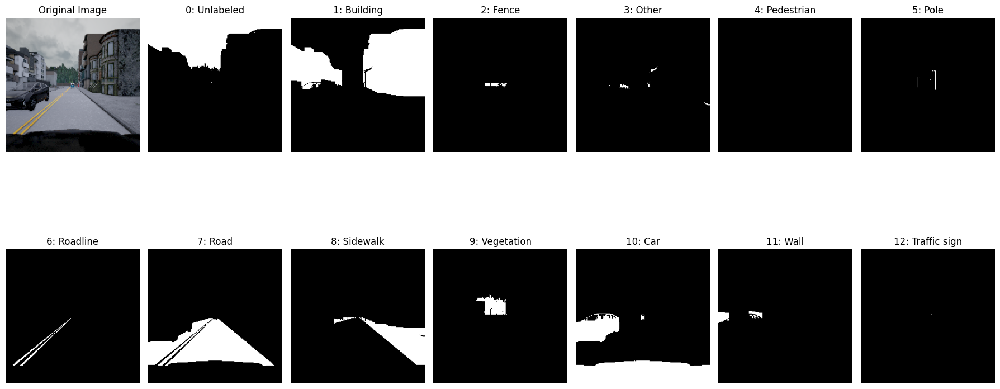

dataset_224/train/images/03_01_152.png
dataset_224/train/labels/03_01_152.png


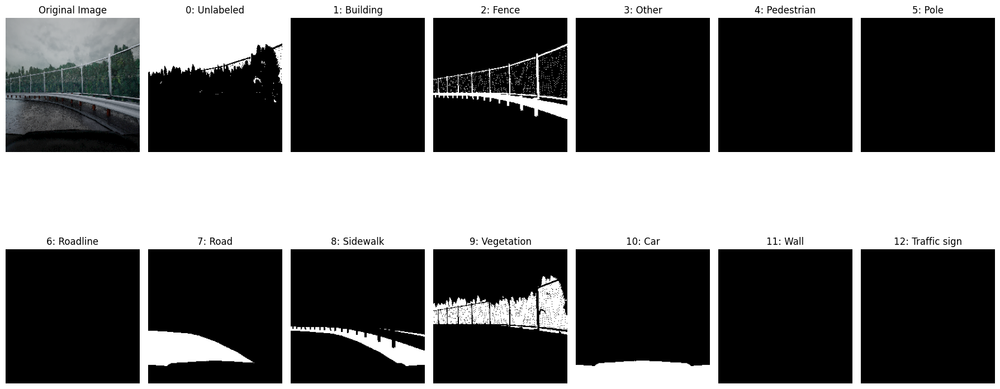

dataset_224/train/images/03_01_102.png
dataset_224/train/labels/03_01_102.png


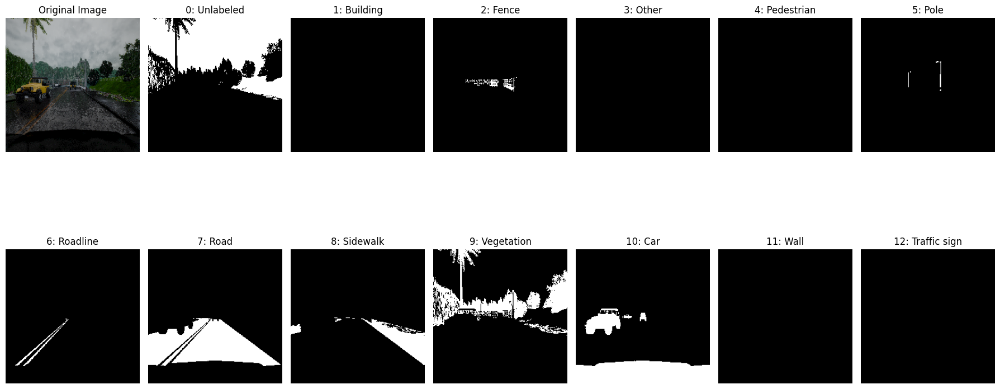

dataset_224/train/images/F6-30.png
dataset_224/train/labels/F6-30.png


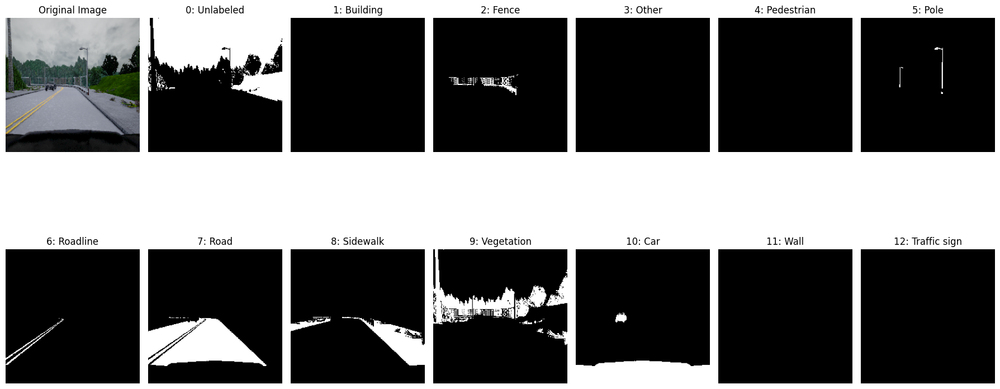

dataset_224/train/images/07_00_121.png
dataset_224/train/labels/07_00_121.png


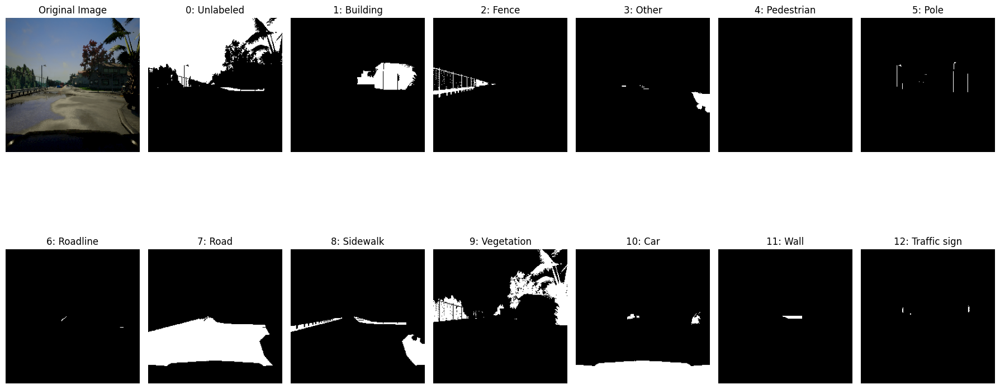

dataset_224/train/images/F2-23.png
dataset_224/train/labels/F2-23.png


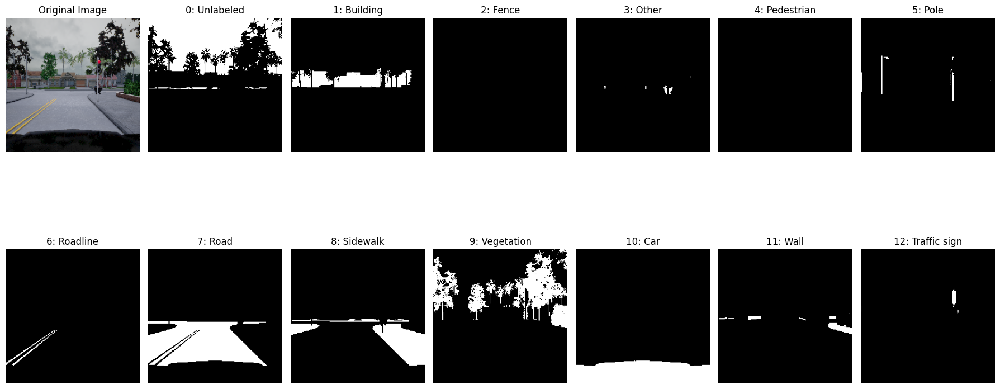

In [6]:
train_image_folder = "dataset_224/train/images"
train_mask_folder = "dataset_224/train/labels"

for i, file_name in enumerate(os.listdir(train_image_folder)):
    img_path = os.path.join(train_image_folder, file_name)
    mask_path = os.path.join(train_mask_folder, file_name)
    print(img_path)
    print(mask_path)
    visualize_segmentation_classes(img_path, mask_path)
    if i>4:
        break


## 2.2 FCN Variants

In [7]:
def load_vgg(type="16"):
    if type=="16":
        vgg = models.vgg16(weights=None)
    elif type=="19":
        vgg = models.vgg19(weights=None)

    return vgg

In [8]:
vgg16=load_vgg("16")
print(vgg16)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [9]:
vgg19=load_vgg("19")
print(vgg19)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

As we can see above, we need to extract outputs of feature layers after 3, 4 and 5 pooling layers for the FCN variants of FCN-8s, FCN-16s and FCN-32s respectively.

1. VGG16

    - pool3 : upto layer 16
    - pool4 : upto layer 23
    - pool5 : upto layer 30

2. VGG19

    - pool3 : upto layer 18
    - pool4 : upto layer 27
    - pool5 : upto layer 36

In [4]:
class vgg_backbone(nn.Module):

    def __init__(self, model_type="vgg16", freeze_weights = True):
        super().__init__()

        if model_type == "vgg16":
            model = models.vgg16(weights="IMAGENET1K_V1")
            features = model.features
            self.pool3 = nn.Sequential(*features[:17])
            self.pool4 = nn.Sequential(*features[17:24])  # till pool4
            self.pool5 = nn.Sequential(*features[24:])  # till pool5

            # Freeze VGG weights
            if freeze_weights:
                for param in self.parameters():
                    param.requires_grad = False

        elif model_type == "vgg19":
            model = models.vgg19(weights="IMAGENET1K_V1")
            features = model.features
            self.pool3 = nn.Sequential(*features[:19])
            self.pool4 = nn.Sequential(*features[19:28])
            self.pool5 = nn.Sequential(*features[28:])

            if freeze_weights:
              for param in self.parameters():
                param.requires_grad = False

        else:
            raise ValueError("model_type must be 'vgg16' or 'vgg19'")

    def forward(self, x):
        x = self.pool3(x)
        f3 = x
        x = self.pool4(x)
        f4 = x
        x = self.pool5(x)
        f5 = x
        return f3, f4, f5

### FCN-32 class

In [5]:
class FCN_32(nn.Module):

    def __init__(self, backbone, num_classes):
        super().__init__()
        self.num_classes = num_classes
        self.backbone = backbone
        self.relu    = nn.ReLU(inplace=True)
        self.deconv1 = nn.ConvTranspose2d(512, 512, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn1     = nn.BatchNorm2d(512)
        self.deconv2 = nn.ConvTranspose2d(512, 256, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn2     = nn.BatchNorm2d(256)
        self.deconv3 = nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn3     = nn.BatchNorm2d(128)
        self.deconv4 = nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn4     = nn.BatchNorm2d(64)
        self.deconv5 = nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn5     = nn.BatchNorm2d(32)
        self.classifier = nn.Conv2d(32, num_classes, kernel_size=1)

    def forward(self, x):
        _, _, f5 = self.backbone(x)  # size=(N, 512, x.H/32, x.W/32)

        score = self.bn1(self.relu(self.deconv1(f5)))     # size=(N, 512, x.H/16, x.W/16)
        score = self.bn2(self.relu(self.deconv2(score)))  # size=(N, 256, x.H/8, x.W/8)
        score = self.bn3(self.relu(self.deconv3(score)))  # size=(N, 128, x.H/4, x.W/4)
        score = self.bn4(self.relu(self.deconv4(score)))  # size=(N, 64, x.H/2, x.W/2)
        score = self.bn5(self.relu(self.deconv5(score)))  # size=(N, 32, x.H, x.W)
        score = self.classifier(score)                    # size=(N, num_classes, x.H/1, x.W/1)

        return score

### FCN-16 class

In [6]:
class FCN_16(nn.Module):

    def __init__(self, backbone, num_classes):
        super().__init__()
        self.num_classes = num_classes
        self.backbone = backbone
        self.relu    = nn.ReLU(inplace=True)
        self.deconv1 = nn.ConvTranspose2d(512, 512, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn1     = nn.BatchNorm2d(512)
        self.deconv2 = nn.ConvTranspose2d(512, 256, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn2     = nn.BatchNorm2d(256)
        self.deconv3 = nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn3     = nn.BatchNorm2d(128)
        self.deconv4 = nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn4     = nn.BatchNorm2d(64)
        self.deconv5 = nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn5     = nn.BatchNorm2d(32)
        self.classifier = nn.Conv2d(32, num_classes, kernel_size=1)

    def forward(self, x):
        _, f4, f5 = self.backbone(x)

        score = self.relu(self.deconv1(f5))               # size=(N, 512, x.H/16, x.W/16)
        score = self.bn1(score + f4)                      # element-wise add, size=(N, 512, x.H/16, x.W/16)
        score = self.bn2(self.relu(self.deconv2(score)))  # size=(N, 256, x.H/8, x.W/8)
        score = self.bn3(self.relu(self.deconv3(score)))  # size=(N, 128, x.H/4, x.W/4)
        score = self.bn4(self.relu(self.deconv4(score)))  # size=(N, 64, x.H/2, x.W/2)
        score = self.bn5(self.relu(self.deconv5(score)))  # size=(N, 32, x.H, x.W)
        score = self.classifier(score)                    # size=(N, num_classes, x.H/1, x.W/1)

        return score  # size=(N, n_class, x.H/1, x.W/1)


### FCN-8 class

In [7]:
class FCN_8(nn.Module):

    def __init__(self, backbone, num_classes):
        super().__init__()
        self.num_classes = num_classes
        self.backbone = backbone
        self.relu    = nn.ReLU(inplace=True)
        self.deconv1 = nn.ConvTranspose2d(512, 512, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn1     = nn.BatchNorm2d(512)
        self.deconv2 = nn.ConvTranspose2d(512, 256, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn2     = nn.BatchNorm2d(256)
        self.deconv3 = nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn3     = nn.BatchNorm2d(128)
        self.deconv4 = nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn4     = nn.BatchNorm2d(64)
        self.deconv5 = nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, dilation=1, output_padding=1)
        self.bn5     = nn.BatchNorm2d(32)
        self.classifier = nn.Conv2d(32, num_classes, kernel_size=1)

    def forward(self, x):
        f3, f4, f5 = self.backbone(x)

        score = self.relu(self.deconv1(f5))               # size=(N, 512, x.H/16, x.W/16)
        score = self.bn1(score + f4)                      # element-wise add, size=(N, 512, x.H/16, x.W/16)
        score = self.relu(self.deconv2(score))            # size=(N, 256, x.H/8, x.W/8)
        score = self.bn2(score + f3)                      # element-wise add, size=(N, 256, x.H/8, x.W/8)
        score = self.bn3(self.relu(self.deconv3(score)))  # size=(N, 128, x.H/4, x.W/4)
        score = self.bn4(self.relu(self.deconv4(score)))  # size=(N, 64, x.H/2, x.W/2)
        score = self.bn5(self.relu(self.deconv5(score)))  # size=(N, 32, x.H, x.W)
        score = self.classifier(score)                    # size=(N, num_classes, x.H/1, x.W/1)

        return score  # size=(N, n_class, x.H/1, x.W/1)


### Dataset loaders and Training loop

In [8]:
class SegmentationDataset(Dataset):
    def __init__(self, image_dir, mask_dir, transform=None, mask_transform=None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.image_filenames = sorted(os.listdir(image_dir))
        if transform:
            self.transform = transform
        else:
            self.transform = T.Compose([
                            T.ToTensor(),
                            T.Normalize(mean=[0.485, 0.456, 0.406],
                                        std=[0.229, 0.224, 0.225])
                        ])
        self.mask_transform = mask_transform

    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, idx):
        img_path = os.path.join(self.image_dir, self.image_filenames[idx])
        mask_path = os.path.join(self.mask_dir, self.image_filenames[idx])

        image = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path)
        mask = np.array(mask)[:, :, 0]

        if self.transform:
            image = self.transform(image)
        if self.mask_transform:
            mask = self.mask_transform(mask)
        else:
            mask = torch.from_numpy(mask).long()

        return image, mask


In [9]:
train_dataset = SegmentationDataset(
    image_dir='dataset_224/train/images',
    mask_dir='dataset_224/train/labels',
)

test_dataset = SegmentationDataset(
    image_dir='dataset_224/test/images',
    mask_dir='dataset_224/test/labels',
)

train_size = int(0.9*len(train_dataset))
val_size = len(train_dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(train_dataset, [train_size, val_size])

print("Number of training samples : ", train_size)
print("Number of validation samples :", val_size)
print("Number of test samples : ", len(test_dataset))

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False, num_workers=4)

Number of training samples :  1800
Number of validation samples : 200
Number of test samples :  500


In [10]:
# LLM - help me implement early stopping here.
# LLM - how to use miou from torchmetrics library in my training loop

def train_model(model, train_loader, val_loader, device, epochs = 10, lr = 0.0001, patience = 5):
    model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    iou_metric = MeanIoU(num_classes=13).to(device)

    best_val_loss = float('inf')
    patience_counter = 0
    best_model_state = None

    for epoch in range(epochs):

      model.train()
      train_loss = 0.0

      for inputs, labels in tqdm(train_loader, desc=f"Training Epoch {epoch+1}"):

        inputs, labels = inputs.to(device), labels.to(device)
        inputs=inputs.float()
        labels=labels.long()

        outputs = model(inputs)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        pred_masks = torch.argmax(outputs, dim=1)
        target_masks = labels.int()
        iou_metric.update(pred_masks, target_masks)

      avg_train_loss = train_loss/len(train_loader)
      iou_results = iou_metric.compute()
      train_miou = iou_results.item()

      iou_metric.reset()

      model.eval()
      val_loss = 0.0

      with torch.no_grad():
        for inputs, labels in tqdm(val_loader, desc=f"Validation Epoch {epoch+1}"):
          inputs, labels = inputs.to(device), labels.to(device)
          inputs=inputs.float()
          labels=labels.long()

          outputs = model(inputs)
          loss = criterion(outputs, labels)

          val_loss += loss.item()
          pred_masks = torch.argmax(outputs, dim=1)
          target_masks = labels.int()
          iou_metric.update(pred_masks, target_masks)

      avg_val_loss = val_loss/len(val_loader)
      iou_results = iou_metric.compute()
      val_miou = iou_results.item()

      iou_metric.reset()

      print(f'Epoch [{epoch+1}/{epochs}], Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}, Train mIoU: {train_miou:.4f}, Val mIoU: {val_miou:.4f}')
      wandb.log({"train_loss": avg_train_loss, "val_loss": avg_val_loss, "train_miou": train_miou, "val_miou": val_miou})

      if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            patience_counter = 0
            best_model_state = model.state_dict()
      else:
          patience_counter += 1
          if patience_counter >= patience:
              print(f"Early stopping at epoch {epoch+1} — no improvement for {patience} consecutive epochs.")
              break

    # Load best model before returning
    if best_model_state:
        model.load_state_dict(best_model_state)

    return model

In [11]:
color_list = [
    "#e6194b", "#3cb44b", "#ffe119", "#4363d8", "#f58231",
    "#911eb4", "#46f0f0", "#f032e6", "#bcf60c", "#fabebe",
    "#008080", "#e6beff", "#9a6324"
]
custom_cmap = ListedColormap(color_list)

In [12]:
def evaluate_and_visualize(model, test_loader, device, num_classes=13, num_samples=5):
    model.eval()
    model.to(device)
    iou_metric = MeanIoU(num_classes=num_classes).to(device)

    all_images = []

    with torch.no_grad():
        for inputs, labels in tqdm(test_loader, desc="Evaluating"):
            inputs, labels = inputs.to(device), labels.to(device)
            inputs = inputs.float()

            outputs = model(inputs)
            preds = torch.argmax(outputs, dim=1)

            iou_metric.update(preds, labels.int())

            for img, gt_mask, pred_mask in zip(inputs, labels, preds):
                all_images.append((img.cpu(), gt_mask.cpu(), pred_mask.cpu()))

    # Compute final mIoU
    miou = iou_metric.compute().item()
    print(f"\nMean IoU on Test Set: {miou:.4f}")

    # Pick `num_samples` random images for visualization
    images_to_plot = random.sample(all_images, min(num_samples, len(all_images)))

    # Define 13 distinct colors
    color_list = [
        "#e6194b", "#3cb44b", "#ffe119", "#4363d8", "#f58231",
        "#911eb4", "#46f0f0", "#f032e6", "#bcf60c", "#fabebe",
        "#008080", "#e6beff", "#9a6324"
    ]
    custom_cmap = ListedColormap(color_list)

    # Visualization
    for i, (img, gt_mask, pred_mask) in enumerate(images_to_plot):
        img_np = img.permute(1, 2, 0).numpy()
        img_np = (img_np * np.array([0.229, 0.224, 0.225])) + np.array([0.485, 0.456, 0.406])  # De-normalize
        img_np = np.clip(img_np, 0, 1)

        plt.figure(figsize=(12, 4))
        plt.subplot(1, 3, 1)
        plt.imshow(img_np)
        plt.title("Input Image")
        plt.axis("off")

        plt.subplot(1, 3, 2)
        plt.imshow(gt_mask, cmap=custom_cmap, vmin=0, vmax=12)
        plt.title("Ground Truth Mask")
        plt.axis("off")

        plt.subplot(1, 3, 3)
        plt.imshow(pred_mask, cmap=custom_cmap, vmin=0, vmax=12)
        plt.title("Predicted Mask")
        plt.axis("off")

        plt.tight_layout()
        plt.show()


In [13]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [14]:
wandb.login()

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: kushang (kushang-international-institute-of-information-technolog). Use `wandb login --relogin` to force relogin


True

### Freezing backbone weights


### The resulting wandb plots of the below training logs are shown below

<img src="figures/Frozen_FCN.png"><img>

#### FCN-32 Training

In [24]:
vgg_model = vgg_backbone(model_type="vgg16", freeze_weights=True)
fcn32_model = FCN_32(vgg_model, num_classes=13)
wandb.init(project='Frozen_Fcn',name="FCN_32")
fcn32_trained = train_model(fcn32_model, train_loader, val_loader, device, epochs = 25)
wandb.finish()

Validation Epoch 1: 100%|██████████| 25/25 [00:02<00:00, 12.34it/s]


Epoch [1/25], Train Loss: 1.3024, Val Loss: 0.7635, Train mIoU: 0.5535, Val mIoU: 0.7469


Validation Epoch 2: 100%|██████████| 25/25 [00:02<00:00, 12.21it/s]


Epoch [2/25], Train Loss: 0.6412, Val Loss: 0.5362, Train mIoU: 0.7559, Val mIoU: 0.7716


Validation Epoch 3: 100%|██████████| 25/25 [00:02<00:00, 11.86it/s]


Epoch [3/25], Train Loss: 0.4767, Val Loss: 0.4354, Train mIoU: 0.7835, Val mIoU: 0.7899


Validation Epoch 4: 100%|██████████| 25/25 [00:02<00:00, 10.16it/s]


Epoch [4/25], Train Loss: 0.3887, Val Loss: 0.3783, Train mIoU: 0.8015, Val mIoU: 0.8023


Validation Epoch 5: 100%|██████████| 25/25 [00:02<00:00, 11.42it/s]


Epoch [5/25], Train Loss: 0.3287, Val Loss: 0.3351, Train mIoU: 0.8176, Val mIoU: 0.8103


Validation Epoch 6: 100%|██████████| 25/25 [00:02<00:00, 11.18it/s]


Epoch [6/25], Train Loss: 0.2858, Val Loss: 0.3074, Train mIoU: 0.8296, Val mIoU: 0.8104


Validation Epoch 7: 100%|██████████| 25/25 [00:02<00:00,  9.83it/s]


Epoch [7/25], Train Loss: 0.2553, Val Loss: 0.2885, Train mIoU: 0.8379, Val mIoU: 0.8179


Validation Epoch 8: 100%|██████████| 25/25 [00:02<00:00, 10.67it/s]


Epoch [8/25], Train Loss: 0.2320, Val Loss: 0.2745, Train mIoU: 0.8441, Val mIoU: 0.8157


Validation Epoch 9: 100%|██████████| 25/25 [00:02<00:00, 11.60it/s]


Epoch [9/25], Train Loss: 0.2126, Val Loss: 0.2660, Train mIoU: 0.8502, Val mIoU: 0.8158


Validation Epoch 10: 100%|██████████| 25/25 [00:02<00:00, 11.84it/s]


Epoch [10/25], Train Loss: 0.1992, Val Loss: 0.2584, Train mIoU: 0.8546, Val mIoU: 0.8208


Validation Epoch 11: 100%|██████████| 25/25 [00:02<00:00, 11.76it/s]


Epoch [11/25], Train Loss: 0.1871, Val Loss: 0.2546, Train mIoU: 0.8590, Val mIoU: 0.8225


Validation Epoch 12: 100%|██████████| 25/25 [00:02<00:00, 11.84it/s]


Epoch [12/25], Train Loss: 0.1761, Val Loss: 0.2487, Train mIoU: 0.8639, Val mIoU: 0.8214


Validation Epoch 13: 100%|██████████| 25/25 [00:02<00:00, 11.92it/s]


Epoch [13/25], Train Loss: 0.1677, Val Loss: 0.2470, Train mIoU: 0.8681, Val mIoU: 0.8262


Validation Epoch 14: 100%|██████████| 25/25 [00:02<00:00,  8.79it/s]


Epoch [14/25], Train Loss: 0.1599, Val Loss: 0.2460, Train mIoU: 0.8716, Val mIoU: 0.8245


Validation Epoch 15: 100%|██████████| 25/25 [00:02<00:00, 11.90it/s]


Epoch [15/25], Train Loss: 0.1526, Val Loss: 0.2448, Train mIoU: 0.8758, Val mIoU: 0.8270


Validation Epoch 16: 100%|██████████| 25/25 [00:02<00:00, 11.93it/s]


Epoch [16/25], Train Loss: 0.1466, Val Loss: 0.2444, Train mIoU: 0.8788, Val mIoU: 0.8271


Validation Epoch 17: 100%|██████████| 25/25 [00:02<00:00, 11.78it/s]


Epoch [17/25], Train Loss: 0.1417, Val Loss: 0.2419, Train mIoU: 0.8807, Val mIoU: 0.8254


Validation Epoch 18: 100%|██████████| 25/25 [00:02<00:00, 10.36it/s]


Epoch [18/25], Train Loss: 0.1366, Val Loss: 0.2445, Train mIoU: 0.8841, Val mIoU: 0.8276


Validation Epoch 19: 100%|██████████| 25/25 [00:02<00:00,  9.57it/s]


Epoch [19/25], Train Loss: 0.1319, Val Loss: 0.2429, Train mIoU: 0.8864, Val mIoU: 0.8278


Validation Epoch 20: 100%|██████████| 25/25 [00:02<00:00, 11.91it/s]


Epoch [20/25], Train Loss: 0.1278, Val Loss: 0.2438, Train mIoU: 0.8885, Val mIoU: 0.8289


Validation Epoch 21: 100%|██████████| 25/25 [00:02<00:00, 10.07it/s]


Epoch [21/25], Train Loss: 0.1245, Val Loss: 0.2454, Train mIoU: 0.8904, Val mIoU: 0.8227


Validation Epoch 22: 100%|██████████| 25/25 [00:02<00:00, 11.81it/s]

Epoch [22/25], Train Loss: 0.1215, Val Loss: 0.2465, Train mIoU: 0.8919, Val mIoU: 0.8265
Early stopping at epoch 22 — no improvement for 5 consecutive epochs.


train_loss,█▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
train_miou,▁▅▆▆▆▇▇▇▇▇▇▇██████████
val_loss,█▅▄▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_miou,▁▃▅▆▆▆▇▇▇▇▇▇████████▇█
train_loss,0.12148
train_miou,0.89191
val_loss,0.24651
val_miou,0.82653


Evaluating:   0%|          | 0/63 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
Evaluating: 100%|██████████| 63/63 [00:05<00:00, 12.07it/s]



Mean IoU on Test Set: 0.8125


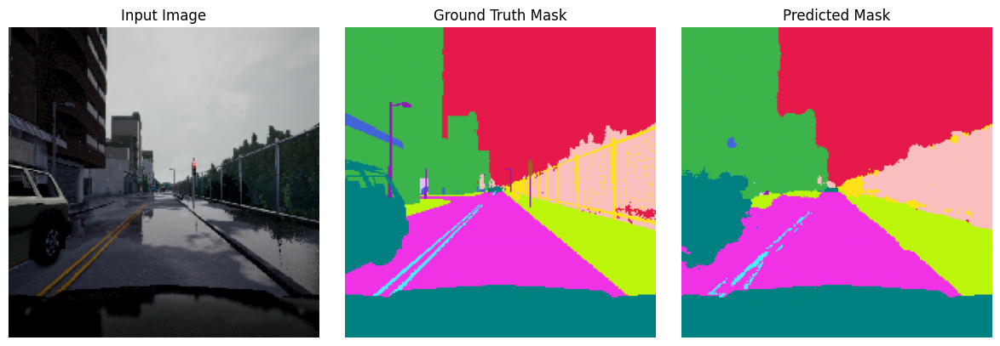

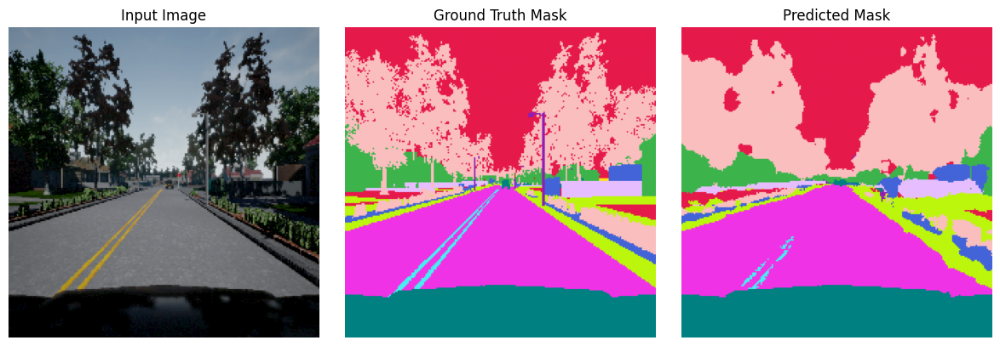

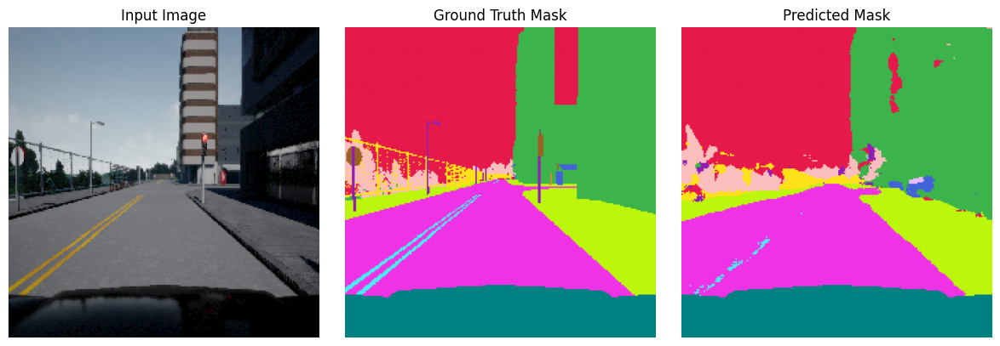

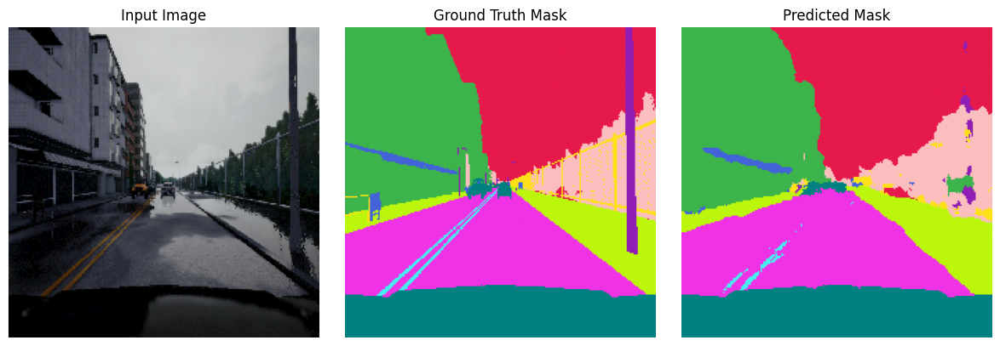

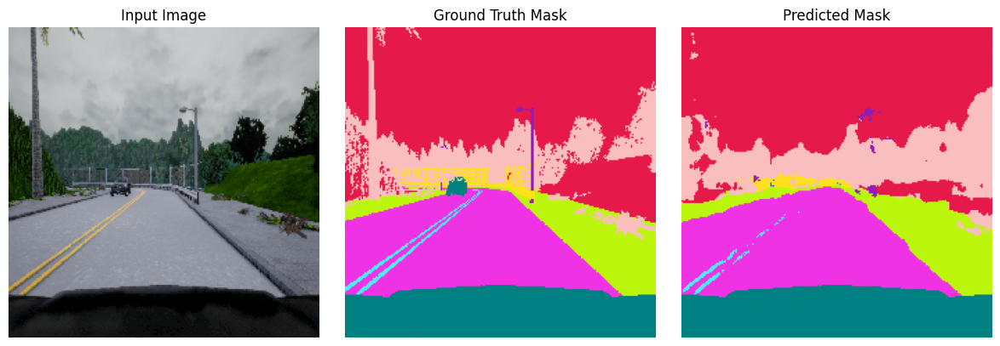

In [42]:
evaluate_and_visualize(fcn32_trained, test_loader, device)

#### FCN-16 Training

In [37]:
vgg_model = vgg_backbone(model_type="vgg16", freeze_weights=True)
fcn16_model = FCN_16(vgg_model, num_classes=13)
wandb.init(project='Frozen_Fcn',name="FCN_16")
fcn16_trained = train_model(fcn16_model, train_loader, val_loader, device, epochs = 25)
wandb.finish()

Validation Epoch 1: 100%|██████████| 25/25 [00:02<00:00,  8.61it/s]


Epoch [1/25], Train Loss: 1.1958, Val Loss: 0.6685, Train mIoU: 0.6422, Val mIoU: 0.8011


Validation Epoch 2: 100%|██████████| 25/25 [00:02<00:00, 11.07it/s]


Epoch [2/25], Train Loss: 0.5765, Val Loss: 0.4775, Train mIoU: 0.8000, Val mIoU: 0.8164


Validation Epoch 3: 100%|██████████| 25/25 [00:02<00:00, 11.92it/s]


Epoch [3/25], Train Loss: 0.4351, Val Loss: 0.3903, Train mIoU: 0.8141, Val mIoU: 0.8263


Validation Epoch 4: 100%|██████████| 25/25 [00:02<00:00, 11.69it/s]


Epoch [4/25], Train Loss: 0.3527, Val Loss: 0.3242, Train mIoU: 0.8257, Val mIoU: 0.8324


Validation Epoch 5: 100%|██████████| 25/25 [00:02<00:00,  9.12it/s]


Epoch [5/25], Train Loss: 0.3009, Val Loss: 0.2872, Train mIoU: 0.8346, Val mIoU: 0.8382


Validation Epoch 6: 100%|██████████| 25/25 [00:03<00:00,  7.89it/s]


Epoch [6/25], Train Loss: 0.2620, Val Loss: 0.2586, Train mIoU: 0.8434, Val mIoU: 0.8431


Validation Epoch 7: 100%|██████████| 25/25 [00:02<00:00, 10.56it/s]


Epoch [7/25], Train Loss: 0.2345, Val Loss: 0.2392, Train mIoU: 0.8498, Val mIoU: 0.8483


Validation Epoch 8: 100%|██████████| 25/25 [00:02<00:00, 11.88it/s]


Epoch [8/25], Train Loss: 0.2130, Val Loss: 0.2275, Train mIoU: 0.8569, Val mIoU: 0.8430


Validation Epoch 9: 100%|██████████| 25/25 [00:02<00:00, 11.62it/s]


Epoch [9/25], Train Loss: 0.1972, Val Loss: 0.2166, Train mIoU: 0.8614, Val mIoU: 0.8473


Validation Epoch 10: 100%|██████████| 25/25 [00:02<00:00, 11.81it/s]


Epoch [10/25], Train Loss: 0.1842, Val Loss: 0.2075, Train mIoU: 0.8659, Val mIoU: 0.8547


Validation Epoch 11: 100%|██████████| 25/25 [00:02<00:00,  9.36it/s]


Epoch [11/25], Train Loss: 0.1740, Val Loss: 0.2042, Train mIoU: 0.8698, Val mIoU: 0.8570


Validation Epoch 12: 100%|██████████| 25/25 [00:02<00:00, 11.65it/s]


Epoch [12/25], Train Loss: 0.1646, Val Loss: 0.1971, Train mIoU: 0.8736, Val mIoU: 0.8567


Validation Epoch 13: 100%|██████████| 25/25 [00:03<00:00,  8.20it/s]


Epoch [13/25], Train Loss: 0.1574, Val Loss: 0.1944, Train mIoU: 0.8768, Val mIoU: 0.8550


Validation Epoch 14: 100%|██████████| 25/25 [00:02<00:00, 10.44it/s]


Epoch [14/25], Train Loss: 0.1518, Val Loss: 0.1898, Train mIoU: 0.8788, Val mIoU: 0.8571


Validation Epoch 15: 100%|██████████| 25/25 [00:02<00:00,  9.40it/s]


Epoch [15/25], Train Loss: 0.1446, Val Loss: 0.1886, Train mIoU: 0.8824, Val mIoU: 0.8574


Validation Epoch 16: 100%|██████████| 25/25 [00:02<00:00,  9.05it/s]


Epoch [16/25], Train Loss: 0.1396, Val Loss: 0.1881, Train mIoU: 0.8844, Val mIoU: 0.8600


Validation Epoch 17: 100%|██████████| 25/25 [00:02<00:00, 11.57it/s]


Epoch [17/25], Train Loss: 0.1356, Val Loss: 0.1846, Train mIoU: 0.8863, Val mIoU: 0.8600


Validation Epoch 18: 100%|██████████| 25/25 [00:02<00:00, 11.59it/s]


Epoch [18/25], Train Loss: 0.1307, Val Loss: 0.1852, Train mIoU: 0.8888, Val mIoU: 0.8602


Validation Epoch 19: 100%|██████████| 25/25 [00:02<00:00, 11.08it/s]


Epoch [19/25], Train Loss: 0.1277, Val Loss: 0.1844, Train mIoU: 0.8901, Val mIoU: 0.8613


Validation Epoch 20: 100%|██████████| 25/25 [00:02<00:00, 11.47it/s]


Epoch [20/25], Train Loss: 0.1249, Val Loss: 0.1839, Train mIoU: 0.8915, Val mIoU: 0.8610


Validation Epoch 21: 100%|██████████| 25/25 [00:02<00:00,  9.27it/s]


Epoch [21/25], Train Loss: 0.1217, Val Loss: 0.1841, Train mIoU: 0.8930, Val mIoU: 0.8591


Validation Epoch 22: 100%|██████████| 25/25 [00:02<00:00, 11.55it/s]


Epoch [22/25], Train Loss: 0.1195, Val Loss: 0.1828, Train mIoU: 0.8939, Val mIoU: 0.8615


Validation Epoch 23: 100%|██████████| 25/25 [00:02<00:00,  9.81it/s]


Epoch [23/25], Train Loss: 0.1167, Val Loss: 0.1837, Train mIoU: 0.8958, Val mIoU: 0.8599


Validation Epoch 24: 100%|██████████| 25/25 [00:02<00:00, 11.58it/s]


Epoch [24/25], Train Loss: 0.1144, Val Loss: 0.1835, Train mIoU: 0.8969, Val mIoU: 0.8619


Validation Epoch 25: 100%|██████████| 25/25 [00:02<00:00, 11.37it/s]

Epoch [25/25], Train Loss: 0.1123, Val Loss: 0.1831, Train mIoU: 0.8980, Val mIoU: 0.8620


train_loss,█▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_miou,▁▅▆▆▆▇▇▇▇▇▇▇▇▇███████████
val_loss,█▅▄▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_miou,▁▃▄▅▅▆▆▆▆▇▇▇▇▇▇██████████
train_loss,0.11227
train_miou,0.89801
val_loss,0.18313
val_miou,0.86198


Evaluating: 100%|██████████| 63/63 [00:05<00:00, 10.81it/s]



Mean IoU on Test Set: 0.8547


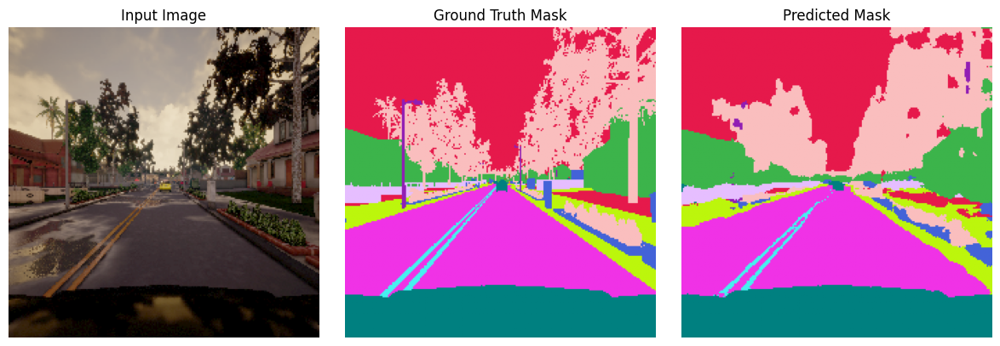

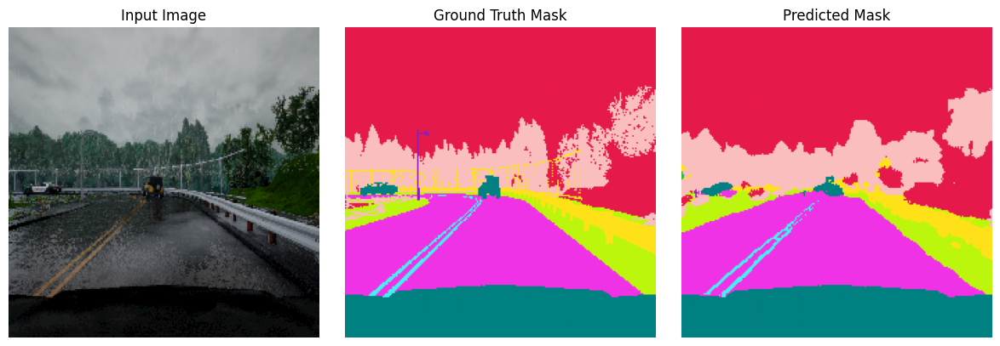

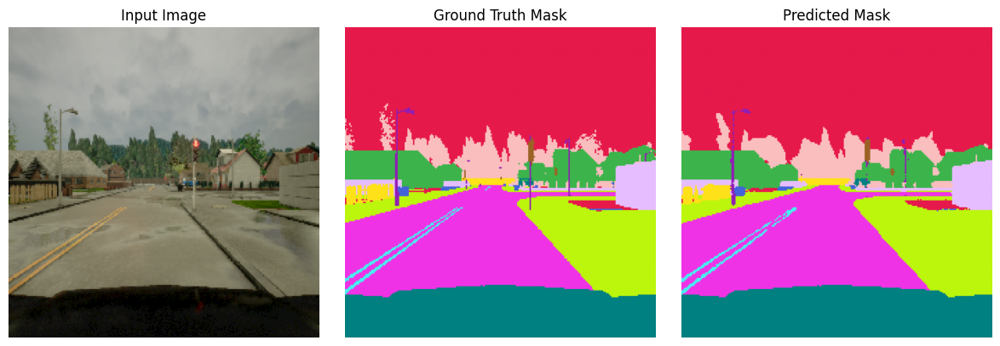

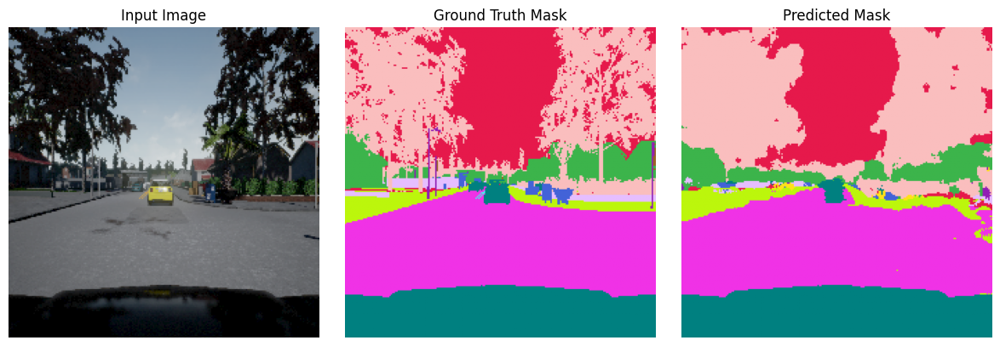

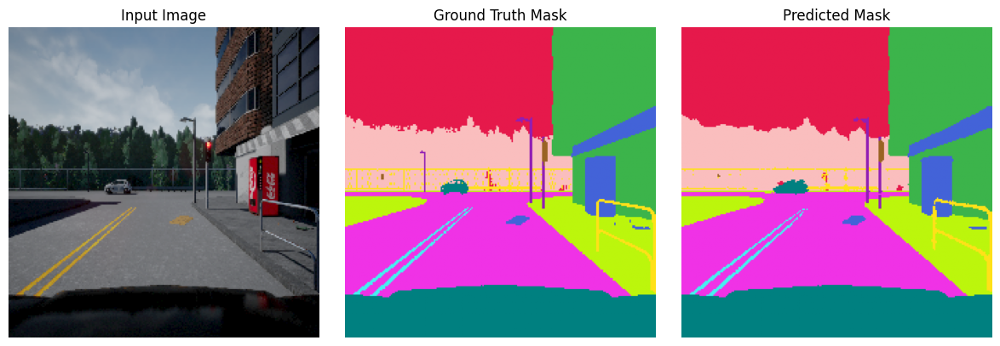

In [43]:
evaluate_and_visualize(fcn16_trained, test_loader, device)

#### FCN-8 Training

In [45]:
vgg_model = vgg_backbone(model_type="vgg16", freeze_weights=True)
fcn8_model = FCN_8(vgg_model, num_classes=13)
wandb.init(project='Frozen_Fcn',name="FCN_8")
fcn8_trained = train_model(fcn8_model, train_loader, val_loader, device, epochs = 25)
wandb.finish()

Validation Epoch 1: 100%|██████████| 25/25 [00:02<00:00, 10.42it/s]


Epoch [1/25], Train Loss: 1.2921, Val Loss: 0.7061, Train mIoU: 0.6280, Val mIoU: 0.7985


Validation Epoch 2: 100%|██████████| 25/25 [00:02<00:00, 10.63it/s]


Epoch [2/25], Train Loss: 0.5793, Val Loss: 0.4798, Train mIoU: 0.8097, Val mIoU: 0.8289


Validation Epoch 3: 100%|██████████| 25/25 [00:02<00:00, 10.81it/s]


Epoch [3/25], Train Loss: 0.4332, Val Loss: 0.3891, Train mIoU: 0.8251, Val mIoU: 0.8363


Validation Epoch 4: 100%|██████████| 25/25 [00:02<00:00,  9.50it/s]


Epoch [4/25], Train Loss: 0.3577, Val Loss: 0.3264, Train mIoU: 0.8330, Val mIoU: 0.8435


Validation Epoch 5: 100%|██████████| 25/25 [00:02<00:00, 10.84it/s]


Epoch [5/25], Train Loss: 0.3064, Val Loss: 0.2849, Train mIoU: 0.8407, Val mIoU: 0.8476


Validation Epoch 6: 100%|██████████| 25/25 [00:02<00:00,  9.73it/s]


Epoch [6/25], Train Loss: 0.2724, Val Loss: 0.2568, Train mIoU: 0.8466, Val mIoU: 0.8555


Validation Epoch 7: 100%|██████████| 25/25 [00:02<00:00, 11.54it/s]


Epoch [7/25], Train Loss: 0.2458, Val Loss: 0.2356, Train mIoU: 0.8535, Val mIoU: 0.8609


Validation Epoch 8: 100%|██████████| 25/25 [00:02<00:00, 10.66it/s]


Epoch [8/25], Train Loss: 0.2244, Val Loss: 0.2205, Train mIoU: 0.8602, Val mIoU: 0.8664


Validation Epoch 9: 100%|██████████| 25/25 [00:02<00:00, 11.68it/s]


Epoch [9/25], Train Loss: 0.2081, Val Loss: 0.2074, Train mIoU: 0.8653, Val mIoU: 0.8701


Validation Epoch 10: 100%|██████████| 25/25 [00:02<00:00, 10.45it/s]


Epoch [10/25], Train Loss: 0.1951, Val Loss: 0.1950, Train mIoU: 0.8692, Val mIoU: 0.8717


Validation Epoch 11: 100%|██████████| 25/25 [00:02<00:00, 11.81it/s]


Epoch [11/25], Train Loss: 0.1849, Val Loss: 0.1868, Train mIoU: 0.8724, Val mIoU: 0.8742


Validation Epoch 12: 100%|██████████| 25/25 [00:02<00:00, 11.53it/s]


Epoch [12/25], Train Loss: 0.1759, Val Loss: 0.1800, Train mIoU: 0.8755, Val mIoU: 0.8751


Validation Epoch 13: 100%|██████████| 25/25 [00:02<00:00, 11.38it/s]


Epoch [13/25], Train Loss: 0.1682, Val Loss: 0.1747, Train mIoU: 0.8783, Val mIoU: 0.8781


Validation Epoch 14: 100%|██████████| 25/25 [00:02<00:00, 11.24it/s]


Epoch [14/25], Train Loss: 0.1614, Val Loss: 0.1701, Train mIoU: 0.8811, Val mIoU: 0.8797


Validation Epoch 15: 100%|██████████| 25/25 [00:02<00:00, 10.21it/s]


Epoch [15/25], Train Loss: 0.1558, Val Loss: 0.1662, Train mIoU: 0.8833, Val mIoU: 0.8801


Validation Epoch 16: 100%|██████████| 25/25 [00:02<00:00, 11.44it/s]


Epoch [16/25], Train Loss: 0.1511, Val Loss: 0.1635, Train mIoU: 0.8848, Val mIoU: 0.8809


Validation Epoch 17: 100%|██████████| 25/25 [00:02<00:00,  9.26it/s]


Epoch [17/25], Train Loss: 0.1468, Val Loss: 0.1605, Train mIoU: 0.8868, Val mIoU: 0.8796


Validation Epoch 18: 100%|██████████| 25/25 [00:02<00:00, 11.66it/s]


Epoch [18/25], Train Loss: 0.1427, Val Loss: 0.1570, Train mIoU: 0.8887, Val mIoU: 0.8832


Validation Epoch 19: 100%|██████████| 25/25 [00:02<00:00,  9.67it/s]


Epoch [19/25], Train Loss: 0.1395, Val Loss: 0.1548, Train mIoU: 0.8898, Val mIoU: 0.8837


Validation Epoch 20: 100%|██████████| 25/25 [00:02<00:00, 11.78it/s]


Epoch [20/25], Train Loss: 0.1356, Val Loss: 0.1529, Train mIoU: 0.8917, Val mIoU: 0.8851


Validation Epoch 21: 100%|██████████| 25/25 [00:02<00:00, 10.24it/s]


Epoch [21/25], Train Loss: 0.1329, Val Loss: 0.1514, Train mIoU: 0.8929, Val mIoU: 0.8858


Validation Epoch 22: 100%|██████████| 25/25 [00:02<00:00, 11.65it/s]


Epoch [22/25], Train Loss: 0.1303, Val Loss: 0.1494, Train mIoU: 0.8942, Val mIoU: 0.8859


Validation Epoch 23: 100%|██████████| 25/25 [00:02<00:00, 11.35it/s]


Epoch [23/25], Train Loss: 0.1280, Val Loss: 0.1487, Train mIoU: 0.8952, Val mIoU: 0.8863


Validation Epoch 24: 100%|██████████| 25/25 [00:02<00:00, 11.69it/s]


Epoch [24/25], Train Loss: 0.1256, Val Loss: 0.1473, Train mIoU: 0.8963, Val mIoU: 0.8863


Validation Epoch 25: 100%|██████████| 25/25 [00:02<00:00, 11.77it/s]

Epoch [25/25], Train Loss: 0.1232, Val Loss: 0.1462, Train mIoU: 0.8973, Val mIoU: 0.8877


train_loss,█▄▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_miou,▁▆▆▆▇▇▇▇▇▇▇▇█████████████
val_loss,█▅▄▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_miou,▁▃▄▅▅▅▆▆▇▇▇▇▇▇▇▇▇████████
train_loss,0.12324
train_miou,0.89733
val_loss,0.14616
val_miou,0.88773


Evaluating: 100%|██████████| 63/63 [00:05<00:00, 12.33it/s]



Mean IoU on Test Set: 0.8838


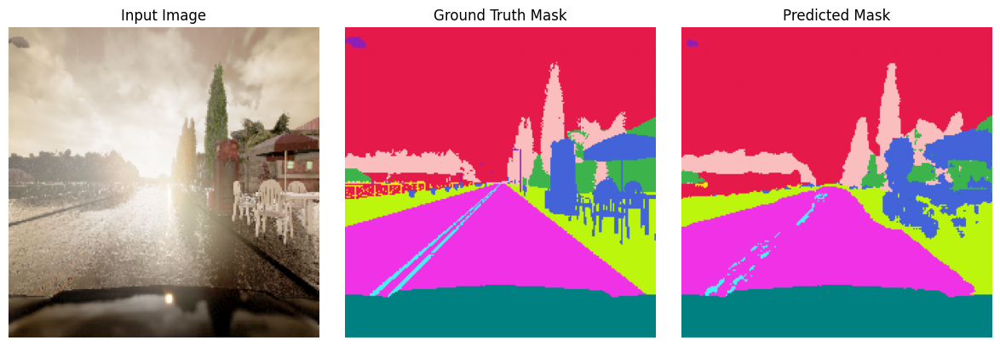

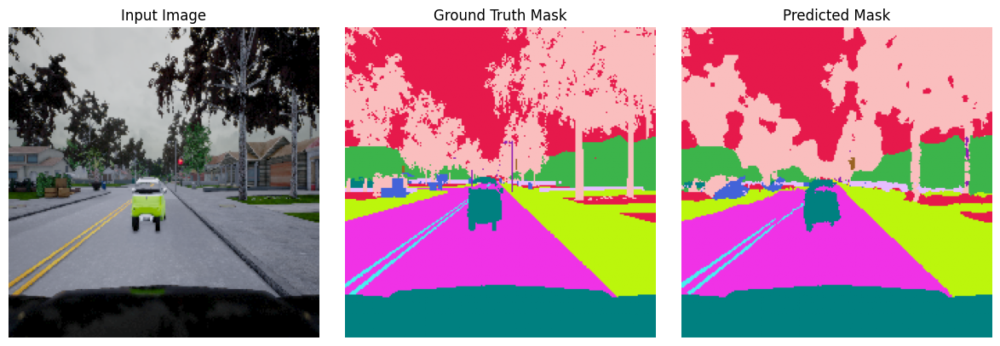

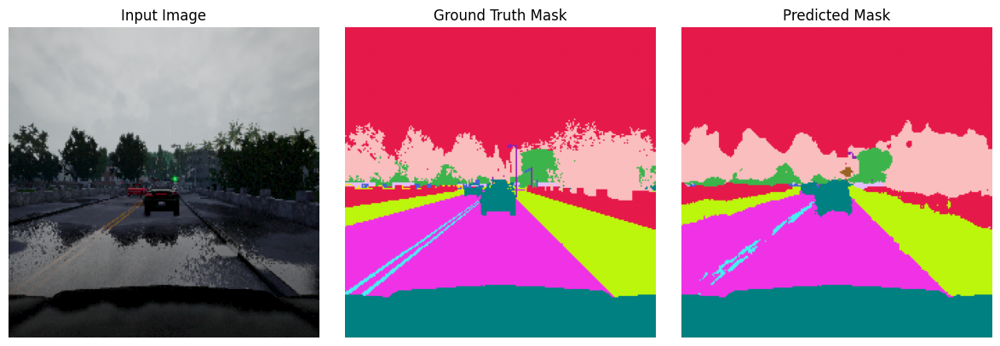

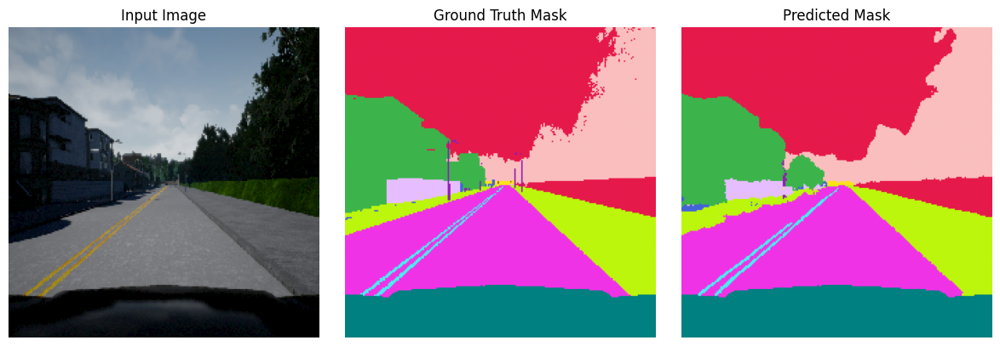

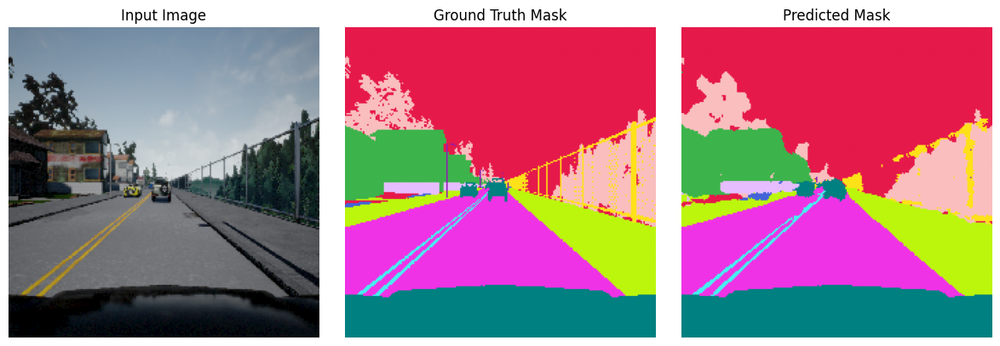

In [46]:
evaluate_and_visualize(fcn8_trained, test_loader, device)

### Un-Freezing weights of the backbone

#### The resulting wandb plots of the loss and miou from the below training logs are shown below

<img src="figures/Unfrozen_FCN.png"><img>

#### FCN-32 Training

In [47]:
vgg_model = vgg_backbone(model_type="vgg16", freeze_weights=False)
fcn32_model = FCN_32(vgg_model, num_classes=13)
wandb.init(project='Unfrozen_Fcn',name="FCN_32")
fcn32_unfreeze_trained = train_model(fcn32_model, train_loader, val_loader, device, epochs = 25)
wandb.finish()

Validation Epoch 1: 100%|██████████| 25/25 [00:02<00:00, 11.02it/s]


Epoch [1/25], Train Loss: 1.2126, Val Loss: 0.7255, Train mIoU: 0.6160, Val mIoU: 0.7919


Validation Epoch 2: 100%|██████████| 25/25 [00:02<00:00, 11.05it/s]


Epoch [2/25], Train Loss: 0.5816, Val Loss: 0.4795, Train mIoU: 0.7982, Val mIoU: 0.8166


Validation Epoch 3: 100%|██████████| 25/25 [00:02<00:00, 11.11it/s]


Epoch [3/25], Train Loss: 0.4305, Val Loss: 0.3823, Train mIoU: 0.8157, Val mIoU: 0.8287


Validation Epoch 4: 100%|██████████| 25/25 [00:02<00:00, 11.39it/s]


Epoch [4/25], Train Loss: 0.3448, Val Loss: 0.3145, Train mIoU: 0.8297, Val mIoU: 0.8438


Validation Epoch 5: 100%|██████████| 25/25 [00:02<00:00, 11.33it/s]


Epoch [5/25], Train Loss: 0.2905, Val Loss: 0.2723, Train mIoU: 0.8415, Val mIoU: 0.8491


Validation Epoch 6: 100%|██████████| 25/25 [00:02<00:00, 11.65it/s]


Epoch [6/25], Train Loss: 0.2543, Val Loss: 0.2434, Train mIoU: 0.8489, Val mIoU: 0.8553


Validation Epoch 7: 100%|██████████| 25/25 [00:02<00:00, 11.63it/s]


Epoch [7/25], Train Loss: 0.2265, Val Loss: 0.2216, Train mIoU: 0.8553, Val mIoU: 0.8549


Validation Epoch 8: 100%|██████████| 25/25 [00:02<00:00,  9.02it/s]


Epoch [8/25], Train Loss: 0.2044, Val Loss: 0.2063, Train mIoU: 0.8611, Val mIoU: 0.8604


Validation Epoch 9: 100%|██████████| 25/25 [00:02<00:00,  9.85it/s]


Epoch [9/25], Train Loss: 0.1880, Val Loss: 0.1946, Train mIoU: 0.8652, Val mIoU: 0.8558


Validation Epoch 10: 100%|██████████| 25/25 [00:02<00:00,  9.64it/s]


Epoch [10/25], Train Loss: 0.1743, Val Loss: 0.1854, Train mIoU: 0.8690, Val mIoU: 0.8642


Validation Epoch 11: 100%|██████████| 25/25 [00:02<00:00,  9.72it/s]


Epoch [11/25], Train Loss: 0.1641, Val Loss: 0.1757, Train mIoU: 0.8719, Val mIoU: 0.8691


Validation Epoch 12: 100%|██████████| 25/25 [00:02<00:00,  9.88it/s]


Epoch [12/25], Train Loss: 0.1532, Val Loss: 0.1676, Train mIoU: 0.8777, Val mIoU: 0.8734


Validation Epoch 13: 100%|██████████| 25/25 [00:02<00:00, 10.07it/s]


Epoch [13/25], Train Loss: 0.1450, Val Loss: 0.1640, Train mIoU: 0.8813, Val mIoU: 0.8729


Validation Epoch 14: 100%|██████████| 25/25 [00:02<00:00,  9.25it/s]


Epoch [14/25], Train Loss: 0.1373, Val Loss: 0.1588, Train mIoU: 0.8850, Val mIoU: 0.8754


Validation Epoch 15: 100%|██████████| 25/25 [00:02<00:00,  9.39it/s]


Epoch [15/25], Train Loss: 0.1307, Val Loss: 0.1539, Train mIoU: 0.8886, Val mIoU: 0.8774


Validation Epoch 16: 100%|██████████| 25/25 [00:02<00:00,  9.48it/s]


Epoch [16/25], Train Loss: 0.1247, Val Loss: 0.1507, Train mIoU: 0.8917, Val mIoU: 0.8793


Validation Epoch 17: 100%|██████████| 25/25 [00:02<00:00,  9.43it/s]


Epoch [17/25], Train Loss: 0.1194, Val Loss: 0.1485, Train mIoU: 0.8944, Val mIoU: 0.8790


Validation Epoch 18: 100%|██████████| 25/25 [00:02<00:00,  9.49it/s]


Epoch [18/25], Train Loss: 0.1156, Val Loss: 0.1463, Train mIoU: 0.8961, Val mIoU: 0.8803


Validation Epoch 19: 100%|██████████| 25/25 [00:02<00:00,  9.26it/s]


Epoch [19/25], Train Loss: 0.1115, Val Loss: 0.1449, Train mIoU: 0.8987, Val mIoU: 0.8798


Validation Epoch 20: 100%|██████████| 25/25 [00:02<00:00,  9.41it/s]


Epoch [20/25], Train Loss: 0.1078, Val Loss: 0.1444, Train mIoU: 0.9011, Val mIoU: 0.8820


Validation Epoch 21: 100%|██████████| 25/25 [00:02<00:00,  9.25it/s]


Epoch [21/25], Train Loss: 0.1053, Val Loss: 0.1427, Train mIoU: 0.9024, Val mIoU: 0.8775


Validation Epoch 22: 100%|██████████| 25/25 [00:02<00:00,  9.38it/s]


Epoch [22/25], Train Loss: 0.1018, Val Loss: 0.1419, Train mIoU: 0.9046, Val mIoU: 0.8820


Validation Epoch 23: 100%|██████████| 25/25 [00:02<00:00,  9.50it/s]


Epoch [23/25], Train Loss: 0.0993, Val Loss: 0.1423, Train mIoU: 0.9064, Val mIoU: 0.8815


Validation Epoch 24: 100%|██████████| 25/25 [00:02<00:00,  8.73it/s]


Epoch [24/25], Train Loss: 0.0975, Val Loss: 0.1420, Train mIoU: 0.9073, Val mIoU: 0.8834


Validation Epoch 25: 100%|██████████| 25/25 [00:02<00:00, 10.79it/s]


Epoch [25/25], Train Loss: 0.0953, Val Loss: 0.1409, Train mIoU: 0.9088, Val mIoU: 0.8835


train_loss,█▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_miou,▁▅▆▆▆▇▇▇▇▇▇▇▇▇███████████
val_loss,█▅▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_miou,▁▃▄▅▅▆▆▆▆▇▇▇▇▇███████████
train_loss,0.09532
train_miou,0.90882
val_loss,0.1409
val_miou,0.88351


Evaluating: 100%|██████████| 63/63 [00:05<00:00, 11.30it/s]



Mean IoU on Test Set: 0.8749


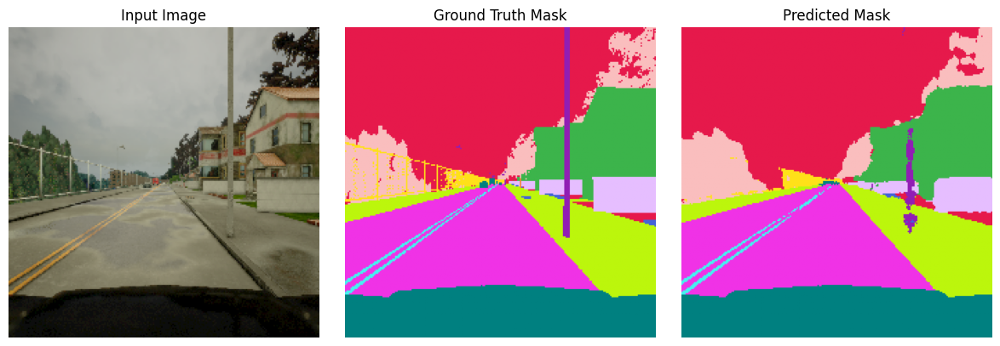

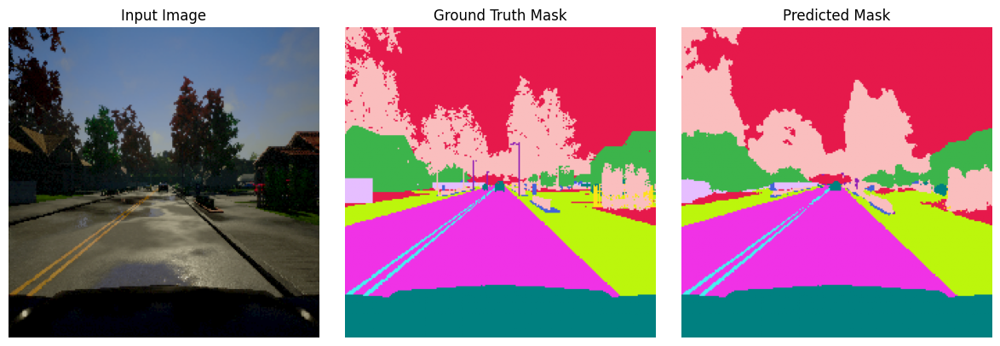

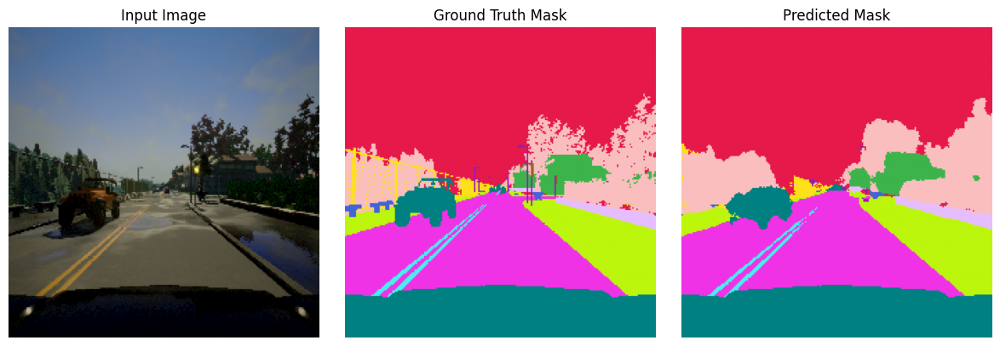

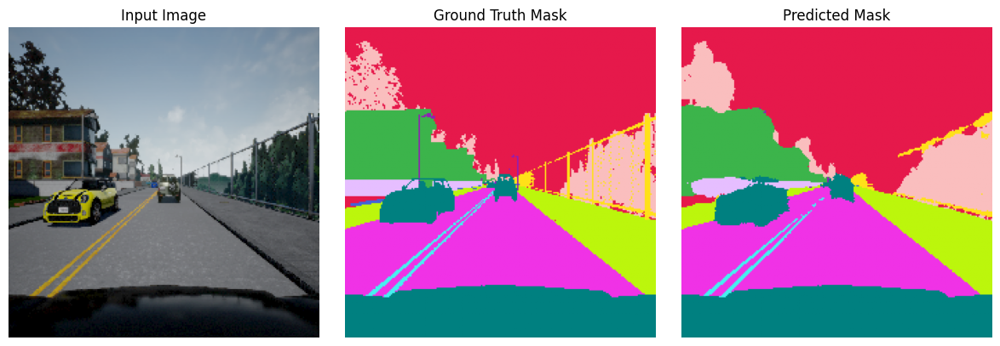

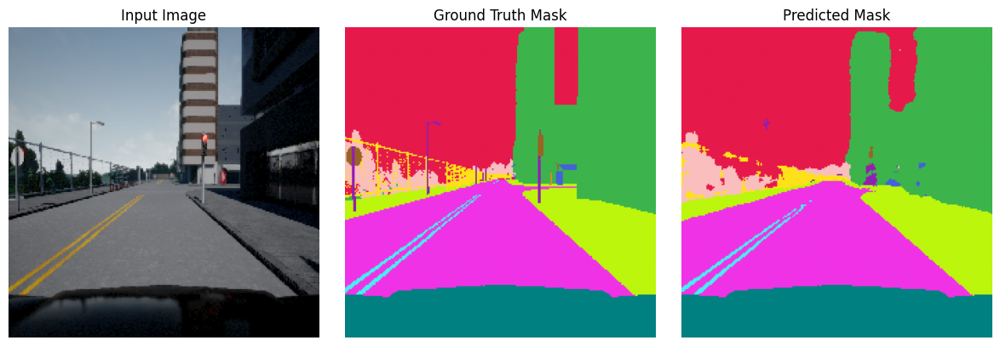

In [48]:
evaluate_and_visualize(fcn32_unfreeze_trained, test_loader, device)

#### FCN-16 Training

In [15]:
vgg_model = vgg_backbone(model_type="vgg16", freeze_weights=False)
fcn16_model = FCN_16(vgg_model, num_classes=13)
wandb.init(project='Unfrozen_Fcn',name="FCN_16")
fcn16_unfreeze_trained = train_model(fcn16_model, train_loader, val_loader, device, epochs = 25)
wandb.finish()

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /home2/kushang/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:12<00:00, 45.9MB/s] 


Validation Epoch 1: 100%|██████████| 25/25 [00:01<00:00, 20.18it/s]


Epoch [1/25], Train Loss: 1.0858, Val Loss: 0.6094, Train mIoU: 0.6738, Val mIoU: 0.8145


Validation Epoch 2: 100%|██████████| 25/25 [00:01<00:00, 20.79it/s]


Epoch [2/25], Train Loss: 0.5074, Val Loss: 0.4219, Train mIoU: 0.8279, Val mIoU: 0.8346


Validation Epoch 3: 100%|██████████| 25/25 [00:01<00:00, 20.65it/s]


Epoch [3/25], Train Loss: 0.3741, Val Loss: 0.3277, Train mIoU: 0.8439, Val mIoU: 0.8406


Validation Epoch 4: 100%|██████████| 25/25 [00:01<00:00, 20.65it/s]


Epoch [4/25], Train Loss: 0.2937, Val Loss: 0.2682, Train mIoU: 0.8568, Val mIoU: 0.8566


Validation Epoch 5: 100%|██████████| 25/25 [00:01<00:00, 21.09it/s]


Epoch [5/25], Train Loss: 0.2427, Val Loss: 0.2270, Train mIoU: 0.8653, Val mIoU: 0.8603


Validation Epoch 6: 100%|██████████| 25/25 [00:01<00:00, 21.00it/s]


Epoch [6/25], Train Loss: 0.2081, Val Loss: 0.2042, Train mIoU: 0.8714, Val mIoU: 0.8657


Validation Epoch 7: 100%|██████████| 25/25 [00:01<00:00, 20.83it/s]


Epoch [7/25], Train Loss: 0.1831, Val Loss: 0.1843, Train mIoU: 0.8764, Val mIoU: 0.8690


Validation Epoch 8: 100%|██████████| 25/25 [00:01<00:00, 20.72it/s]


Epoch [8/25], Train Loss: 0.1642, Val Loss: 0.1707, Train mIoU: 0.8838, Val mIoU: 0.8753


Validation Epoch 9: 100%|██████████| 25/25 [00:01<00:00, 20.24it/s]


Epoch [9/25], Train Loss: 0.1499, Val Loss: 0.1578, Train mIoU: 0.8904, Val mIoU: 0.8836


Validation Epoch 10: 100%|██████████| 25/25 [00:01<00:00, 21.26it/s]


Epoch [10/25], Train Loss: 0.1367, Val Loss: 0.1506, Train mIoU: 0.8965, Val mIoU: 0.8873


Validation Epoch 11: 100%|██████████| 25/25 [00:01<00:00, 21.12it/s]


Epoch [11/25], Train Loss: 0.1273, Val Loss: 0.1434, Train mIoU: 0.9005, Val mIoU: 0.8895


Validation Epoch 12: 100%|██████████| 25/25 [00:01<00:00, 20.85it/s]


Epoch [12/25], Train Loss: 0.1193, Val Loss: 0.1374, Train mIoU: 0.9039, Val mIoU: 0.8914


Validation Epoch 13: 100%|██████████| 25/25 [00:01<00:00, 20.77it/s]


Epoch [13/25], Train Loss: 0.1125, Val Loss: 0.1332, Train mIoU: 0.9067, Val mIoU: 0.8928


Validation Epoch 14: 100%|██████████| 25/25 [00:01<00:00, 19.96it/s]


Epoch [14/25], Train Loss: 0.1063, Val Loss: 0.1292, Train mIoU: 0.9096, Val mIoU: 0.8941


Validation Epoch 15: 100%|██████████| 25/25 [00:01<00:00, 20.26it/s]


Epoch [15/25], Train Loss: 0.1014, Val Loss: 0.1269, Train mIoU: 0.9121, Val mIoU: 0.8940


Validation Epoch 16: 100%|██████████| 25/25 [00:01<00:00, 20.76it/s]


Epoch [16/25], Train Loss: 0.0974, Val Loss: 0.1266, Train mIoU: 0.9141, Val mIoU: 0.8952


Validation Epoch 17: 100%|██████████| 25/25 [00:01<00:00, 20.92it/s]


Epoch [17/25], Train Loss: 0.0937, Val Loss: 0.1240, Train mIoU: 0.9158, Val mIoU: 0.8958


Validation Epoch 18: 100%|██████████| 25/25 [00:01<00:00, 20.69it/s]


Epoch [18/25], Train Loss: 0.0908, Val Loss: 0.1225, Train mIoU: 0.9174, Val mIoU: 0.8965


Validation Epoch 19: 100%|██████████| 25/25 [00:01<00:00, 20.65it/s]


Epoch [19/25], Train Loss: 0.0873, Val Loss: 0.1211, Train mIoU: 0.9194, Val mIoU: 0.8975


Validation Epoch 20: 100%|██████████| 25/25 [00:01<00:00, 21.24it/s]


Epoch [20/25], Train Loss: 0.0847, Val Loss: 0.1209, Train mIoU: 0.9209, Val mIoU: 0.8955


Validation Epoch 21: 100%|██████████| 25/25 [00:01<00:00, 21.24it/s]


Epoch [21/25], Train Loss: 0.0824, Val Loss: 0.1200, Train mIoU: 0.9223, Val mIoU: 0.8983


Validation Epoch 22: 100%|██████████| 25/25 [00:01<00:00, 20.74it/s]


Epoch [22/25], Train Loss: 0.0800, Val Loss: 0.1197, Train mIoU: 0.9238, Val mIoU: 0.8988


Validation Epoch 23: 100%|██████████| 25/25 [00:01<00:00, 20.58it/s]


Epoch [23/25], Train Loss: 0.0776, Val Loss: 0.1203, Train mIoU: 0.9253, Val mIoU: 0.8999


Validation Epoch 24: 100%|██████████| 25/25 [00:01<00:00, 21.06it/s]


Epoch [24/25], Train Loss: 0.0758, Val Loss: 0.1194, Train mIoU: 0.9268, Val mIoU: 0.8991


Validation Epoch 25: 100%|██████████| 25/25 [00:01<00:00, 21.42it/s]


Epoch [25/25], Train Loss: 0.0745, Val Loss: 0.1194, Train mIoU: 0.9274, Val mIoU: 0.9004


train_loss,█▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_miou,▁▅▆▆▆▆▇▇▇▇▇▇▇████████████
val_loss,█▅▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_miou,▁▃▃▄▅▅▅▆▇▇▇▇▇▇▇██████████
train_loss,0.0745
train_miou,0.9274
val_loss,0.11938
val_miou,0.90036


Evaluating: 100%|██████████| 63/63 [00:03<00:00, 19.98it/s]



Mean IoU on Test Set: 0.9002


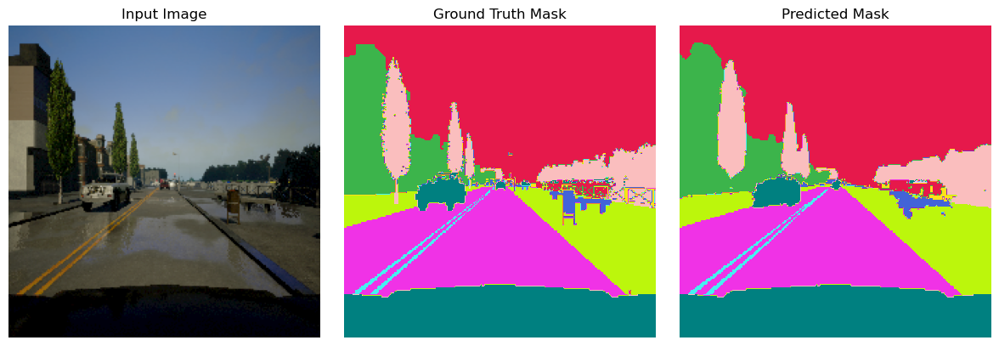

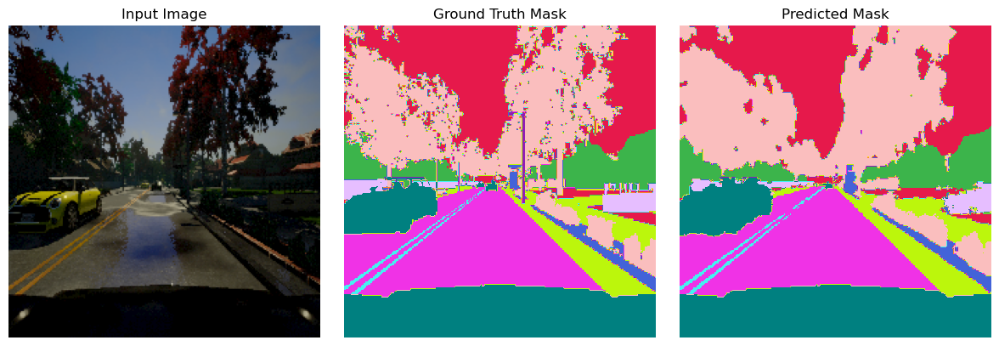

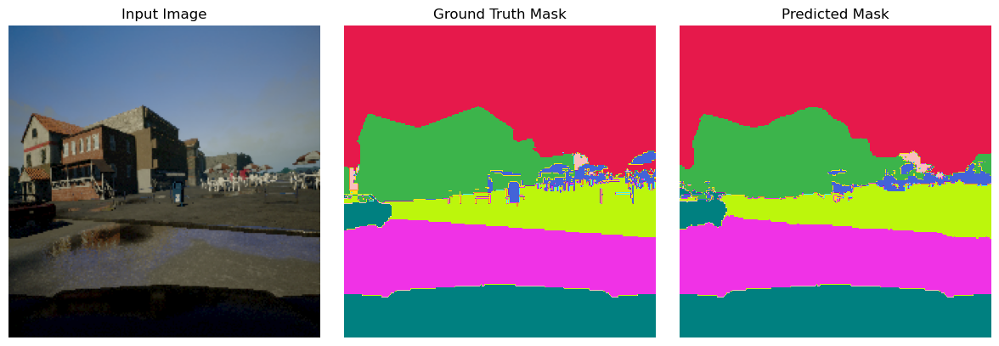

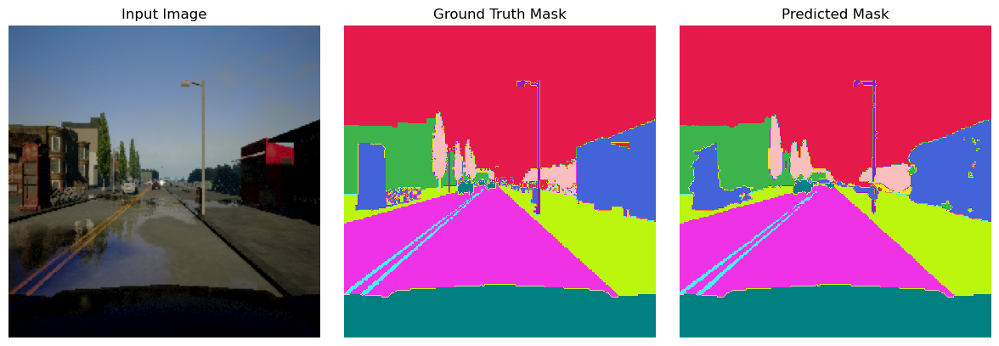

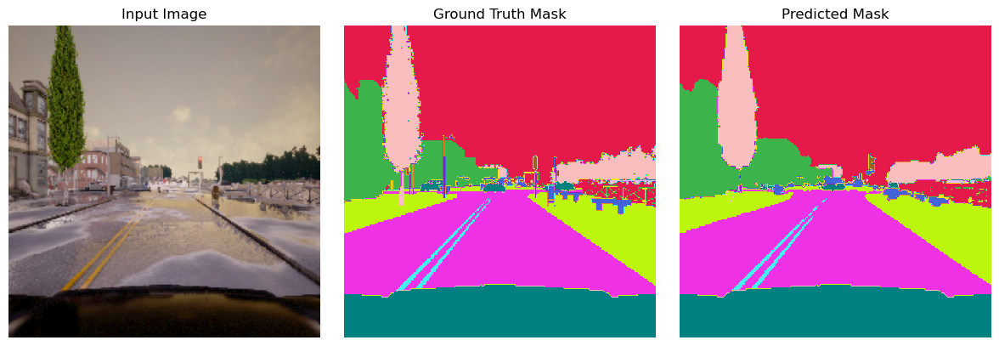

In [16]:
evaluate_and_visualize(fcn16_unfreeze_trained, test_loader, device)

#### FCN-8 Training

In [17]:
vgg_model = vgg_backbone(model_type="vgg16", freeze_weights=False)
fcn8_model = FCN_8(vgg_model, num_classes=13)
wandb.init(project='Unfrozen_Fcn',name="FCN_8")
fcn8_unfreeze_trained = train_model(fcn8_model, train_loader, val_loader, device, epochs = 25)
wandb.finish()

Validation Epoch 1: 100%|██████████| 25/25 [00:01<00:00, 19.82it/s]


Epoch [1/25], Train Loss: 1.0983, Val Loss: 0.5915, Train mIoU: 0.6891, Val mIoU: 0.8255


Validation Epoch 2: 100%|██████████| 25/25 [00:01<00:00, 20.34it/s]


Epoch [2/25], Train Loss: 0.4853, Val Loss: 0.4041, Train mIoU: 0.8391, Val mIoU: 0.8459


Validation Epoch 3: 100%|██████████| 25/25 [00:01<00:00, 21.08it/s]


Epoch [3/25], Train Loss: 0.3614, Val Loss: 0.3253, Train mIoU: 0.8507, Val mIoU: 0.8520


Validation Epoch 4: 100%|██████████| 25/25 [00:01<00:00, 20.71it/s]


Epoch [4/25], Train Loss: 0.2880, Val Loss: 0.2599, Train mIoU: 0.8620, Val mIoU: 0.8650


Validation Epoch 5: 100%|██████████| 25/25 [00:01<00:00, 20.77it/s]


Epoch [5/25], Train Loss: 0.2359, Val Loss: 0.2178, Train mIoU: 0.8733, Val mIoU: 0.8700


Validation Epoch 6: 100%|██████████| 25/25 [00:01<00:00, 20.32it/s]


Epoch [6/25], Train Loss: 0.1995, Val Loss: 0.1906, Train mIoU: 0.8817, Val mIoU: 0.8793


Validation Epoch 7: 100%|██████████| 25/25 [00:01<00:00, 20.89it/s]


Epoch [7/25], Train Loss: 0.1747, Val Loss: 0.1694, Train mIoU: 0.8889, Val mIoU: 0.8894


Validation Epoch 8: 100%|██████████| 25/25 [00:01<00:00, 20.51it/s]


Epoch [8/25], Train Loss: 0.1560, Val Loss: 0.1560, Train mIoU: 0.8959, Val mIoU: 0.8939


Validation Epoch 9: 100%|██████████| 25/25 [00:01<00:00, 20.27it/s]


Epoch [9/25], Train Loss: 0.1413, Val Loss: 0.1450, Train mIoU: 0.9008, Val mIoU: 0.8977


Validation Epoch 10: 100%|██████████| 25/25 [00:01<00:00, 20.38it/s]


Epoch [10/25], Train Loss: 0.1291, Val Loss: 0.1365, Train mIoU: 0.9053, Val mIoU: 0.8985


Validation Epoch 11: 100%|██████████| 25/25 [00:01<00:00, 20.18it/s]


Epoch [11/25], Train Loss: 0.1201, Val Loss: 0.1306, Train mIoU: 0.9089, Val mIoU: 0.9004


Validation Epoch 12: 100%|██████████| 25/25 [00:01<00:00, 20.71it/s]


Epoch [12/25], Train Loss: 0.1123, Val Loss: 0.1238, Train mIoU: 0.9122, Val mIoU: 0.9041


Validation Epoch 13: 100%|██████████| 25/25 [00:01<00:00, 20.75it/s]


Epoch [13/25], Train Loss: 0.1059, Val Loss: 0.1190, Train mIoU: 0.9151, Val mIoU: 0.9049


Validation Epoch 14: 100%|██████████| 25/25 [00:01<00:00, 21.10it/s]


Epoch [14/25], Train Loss: 0.1005, Val Loss: 0.1160, Train mIoU: 0.9174, Val mIoU: 0.9066


Validation Epoch 15: 100%|██████████| 25/25 [00:01<00:00, 20.71it/s]


Epoch [15/25], Train Loss: 0.0958, Val Loss: 0.1121, Train mIoU: 0.9196, Val mIoU: 0.9087


Validation Epoch 16: 100%|██████████| 25/25 [00:01<00:00, 20.69it/s]


Epoch [16/25], Train Loss: 0.0918, Val Loss: 0.1108, Train mIoU: 0.9215, Val mIoU: 0.9093


Validation Epoch 17: 100%|██████████| 25/25 [00:01<00:00, 20.57it/s]


Epoch [17/25], Train Loss: 0.0881, Val Loss: 0.1098, Train mIoU: 0.9232, Val mIoU: 0.9100


Validation Epoch 18: 100%|██████████| 25/25 [00:01<00:00, 20.91it/s]


Epoch [18/25], Train Loss: 0.0848, Val Loss: 0.1065, Train mIoU: 0.9250, Val mIoU: 0.9104


Validation Epoch 19: 100%|██████████| 25/25 [00:01<00:00, 20.81it/s]


Epoch [19/25], Train Loss: 0.0822, Val Loss: 0.1069, Train mIoU: 0.9264, Val mIoU: 0.9112


Validation Epoch 20: 100%|██████████| 25/25 [00:01<00:00, 21.50it/s]


Epoch [20/25], Train Loss: 0.0793, Val Loss: 0.1045, Train mIoU: 0.9280, Val mIoU: 0.9114


Validation Epoch 21: 100%|██████████| 25/25 [00:01<00:00, 20.30it/s]


Epoch [21/25], Train Loss: 0.0769, Val Loss: 0.1033, Train mIoU: 0.9293, Val mIoU: 0.9126


Validation Epoch 22: 100%|██████████| 25/25 [00:01<00:00, 21.08it/s]


Epoch [22/25], Train Loss: 0.0747, Val Loss: 0.1034, Train mIoU: 0.9308, Val mIoU: 0.9125


Validation Epoch 23: 100%|██████████| 25/25 [00:01<00:00, 21.49it/s]


Epoch [23/25], Train Loss: 0.0729, Val Loss: 0.1024, Train mIoU: 0.9319, Val mIoU: 0.9140


Validation Epoch 24: 100%|██████████| 25/25 [00:01<00:00, 21.23it/s]


Epoch [24/25], Train Loss: 0.0708, Val Loss: 0.1015, Train mIoU: 0.9331, Val mIoU: 0.9146


Validation Epoch 25: 100%|██████████| 25/25 [00:01<00:00, 20.59it/s]


Epoch [25/25], Train Loss: 0.0691, Val Loss: 0.1017, Train mIoU: 0.9342, Val mIoU: 0.9137


train_loss,█▄▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_miou,▁▅▆▆▆▇▇▇▇▇▇▇▇████████████
val_loss,█▅▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_miou,▁▃▃▄▄▅▆▆▇▇▇▇▇▇███████████
train_loss,0.06908
train_miou,0.93425
val_loss,0.10166
val_miou,0.91374


Evaluating: 100%|██████████| 63/63 [00:02<00:00, 21.79it/s]



Mean IoU on Test Set: 0.9150


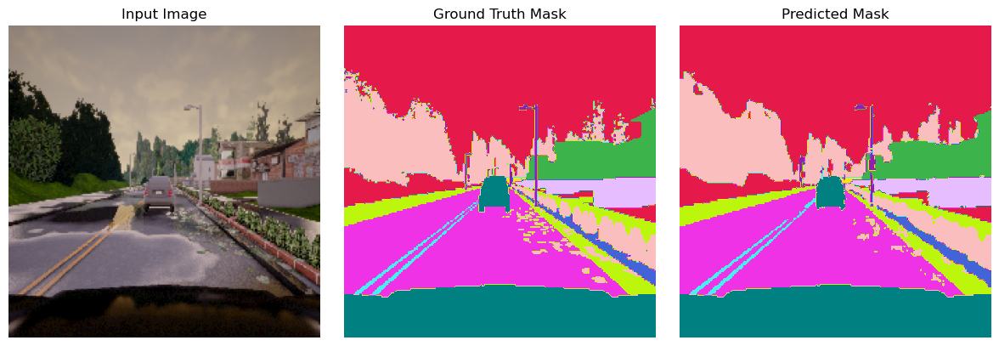

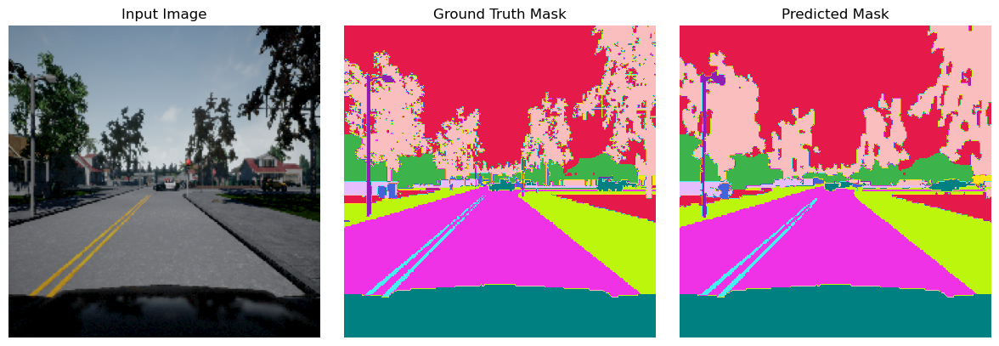

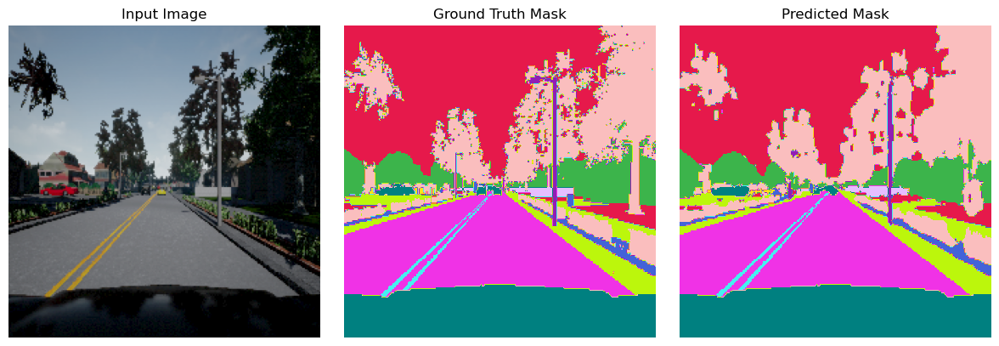

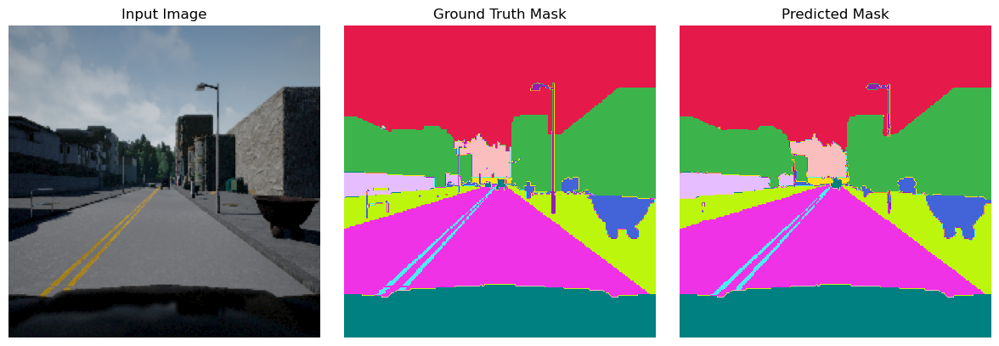

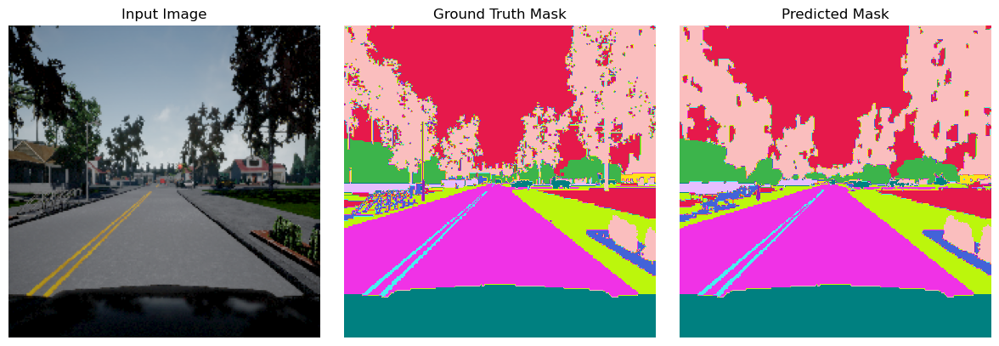

In [18]:
evaluate_and_visualize(fcn8_unfreeze_trained, test_loader, device)

### Comparison of frozen and finetuned backbone (VGG-16)

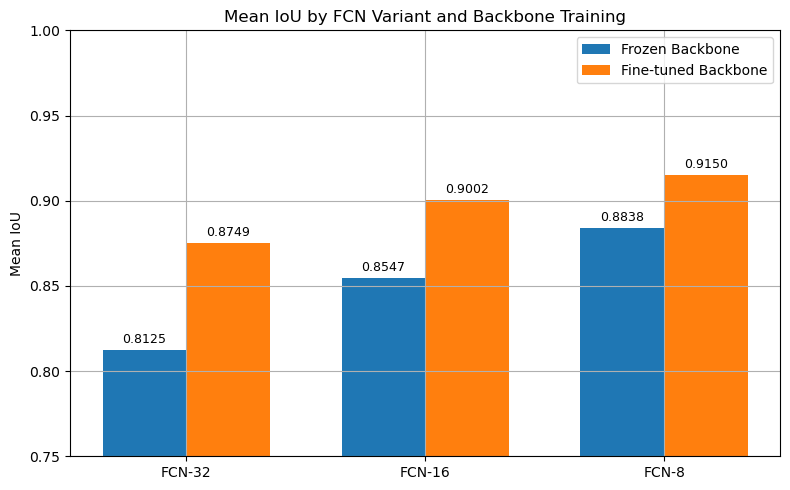

In [4]:
# LLM - help me plot the following as a comparison bar plot for fcn-32, fcn-16, fcn-8 where the backbone weights are frozen and when they are fine-tuned 

import matplotlib.pyplot as plt
import numpy as np

models = ['FCN-32', 'FCN-16', 'FCN-8']
frozen_iou = [0.8125, 0.8547, 0.8838]
unfrozen_iou = [0.8749, 0.9002, 0.9150]

x = np.arange(len(models)) 
width = 0.35  

fig, ax = plt.subplots(figsize=(8, 5))
bars1 = ax.bar(x - width/2, frozen_iou, width, label='Frozen Backbone', color='#1f77b4')
bars2 = ax.bar(x + width/2, unfrozen_iou, width, label='Fine-tuned Backbone', color='#ff7f0e')

ax.set_ylabel('Mean IoU')
ax.set_title('Mean IoU by FCN Variant and Backbone Training')
ax.set_xticks(x)
ax.set_xticklabels(models)
ax.set_ylim(0.75, 1.0)
ax.legend()

for bar in bars1 + bars2:
    height = bar.get_height()
    ax.annotate(f'{height:.4f}',
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3),  
                textcoords="offset points",
                ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.grid()
plt.savefig('figures/fcn_miou_comparison.png')
plt.show()


## FCN Variants: Architectural Differences

FCN (Fully Convolutional Network) variants differ primarily in how they handle upsampling and feature fusion:

*FCN-32s*: The simplest variant that performs direct 32× upsampling from the final convolutional layer to the original image size. It lacks fine-grained detail due to the large stride.

*FCN-16s*: Combines predictions from both pool4 (stride 16) and the final layer. This creates a skip connection that fuses coarse, high-level information with finer, lower-level information.

*FCN-8s*: Adds another skip connection from pool3 (stride 8), incorporating even more fine-grained spatial information. This three-stream architecture combines features at different resolutions.

## Performance Analysis

Your results clearly demonstrate performance patterns across these architectures:

1.⁠ ⁠*Progression of Performance*:
   - FCN-8s consistently outperforms FCN-16s, which outperforms FCN-32s
   - Mean IoU increases as more skip connections are added (0.8749→0.9002→0.9150 for fine-tuned)

2.⁠ ⁠*Frozen vs. Fine-tuned Backbone*:
   - Fine-tuned backbone consistently yields better results across all FCN variants
   - The performance gap is most significant in FCN-32s (0.8125 vs. 0.8749, difference of 0.0624)
   - The gap narrows for FCN-16s (0.8547 vs. 0.9002, difference of 0.0455)
   - The gap is smallest but still substantial for FCN-8s (0.8838 vs. 0.9150, difference of 0.0312)

3.⁠ ⁠*Relative Improvements*:
   - From FCN-32s to FCN-8s: 8.8% improvement with frozen backbone, 4.6% with fine-tuned
   - Fine-tuning provides approximately 3.5-7.7% better performance across variants

## Implications

1.⁠ ⁠*Skip Connections*: The results confirm that integrating features from earlier layers significantly improves segmentation quality, particularly boundary delineation.

2.⁠ ⁠*Backbone Training*: Fine-tuning the backbone allows the network to adapt feature extraction specifically to your segmentation task, yielding consistent improvements.

3.⁠ ⁠*Diminishing Returns*: The decreasing gap between frozen and fine-tuned backbones as skip connections increase suggests that better architecture partially compensates for limited feature adaptation.

These results align with theoretical expectations that multi-scale feature fusion and task-specific feature learning both contribute substantially to segmentation performance.